# GRID VISUALIZATION - STATIC IMAGE

In [227]:
from PIL import Image, ImageFile
from PIL import ImageFont, ImageDraw
import pandas as pd
from os.path import join, isfile
import numpy as np
import pysam

import sys


def get_df_full(outdir, samples_ids):
    """Get a dataframe with ALL the information about the variants."""
    with open(join(outdir, "names.txt")) as n:
        list_names = n.readlines()
    names = [word.strip() for word in list_names]
    columns_df = (
        [
            "svs",
            "chr1",
            "start1",
            "end1",
            "chr2",
            "start2",
            "end2",
            "name",
            "score",
            "strand1",
            "strand2",
            "type",
            "annot",
        ]
        + ["COV {}".format(sample_id) for sample_id in samples_ids]
        + ["callers"]
    )
    svs_table = join(outdir, "merged_svs_annot.tsv")
    df_in = pd.read_csv(svs_table, sep="\t", header=None, names=columns_df)
    df_in.insert(0, "names_files", names)
    df_full = df_in
    return df_full


def get_sv_path(outdir, sample_id, sv, df):
    list_svs = df["name"].tolist()
    files = df["names_files"].tolist()
    index_sv = list_svs.index(sv)
    base_name_sv = files[index_sv]
    filename = "{}_{}.{}".format(sample_id, base_name_sv, "png")
    path_snap = join(outdir, sample_id, "snapshots", filename)
    return path_snap


def highlight(img, coords, fill, width=5):
    draw = ImageDraw.Draw(img, "RGBA")
    draw.rectangle(coords, fill=fill)
    return img


def centered_pos(draw, x, y, txt, font, axis):
    tx, ty = draw.textsize(txt, font=font)
    if axis == "x":
        cx = x - tx / 2
        cy = y
    elif axis == "y":
        cx = x
        cy = y - ty / 2
    else:
        cx = x - tx / 2
        cy = y - ty / 2
    return (cx, cy)


def draw_labels(labels, positions, img, centering_axis=""):
    font_size = 40
    global_font = "/home/varelad/dash/LiberationSans-Regular.ttf"
    font = ImageFont.truetype(global_font, font_size, encoding="unic")
    for label, pos in zip(labels, positions):
        draw = ImageDraw.Draw(img)
        if centering_axis:
            draw.text(
                centered_pos(draw, pos[0], pos[1], label, font, centering_axis),
                label,
                fill="black",
                font=font,
            )
        else:
            draw.text((pos[0], pos[1]), label, fill="black", font=font)
    return img


def get_df_filter(df_out, filters):
    df_to_filter = df_out[filters]
    return df_to_filter


def make_grids(outdir, samples_ids, df_out):
    list_svs = df_out["name"].tolist()
    rows = samples_ids + ["annotation"]
    df_svs = pd.DataFrame(index=rows, columns=list_svs)
    df_path = pd.DataFrame(index=samples_ids, columns=list_svs)
    circos_list = []
    for sample in range(len(samples_ids)):
        sample_id = samples_ids[sample]
        circos = join(outdir, sample_id, "%s_circos.png" % sample_id)
        circos_list.append(circos)
        for sv in range(len(list_svs)):
            name_sv = list_svs[sv]
            df_svs.iloc[sample, sv] = [sample_id, name_sv]
            df_path.iloc[sample, sv] = get_sv_path(outdir, sample_id, name_sv, df_out)
    df_svs.loc["annotation"] = df_out["annot"].tolist()
    df_svs.insert(0, "CIRCOS PLOT", circos_list + [""])
    df_path.insert(0, "CIRCOS PLOT", circos_list)
    df_svs.insert(0, "SAMPLE ID", samples_ids + [""])
    keys = list_svs
    values = df_out["annot"].tolist()
    dict_annotation = dict(zip(keys, values))
    return df_svs, df_path, dict_annotation


def callers_color(sample_id, name_sv, df_out):
    list_svs = df_out["name"].tolist()
    index_sv = list_svs.index(name_sv)
    callers = df_out["callers"].tolist()
    callers_sv = callers[index_sv]
    called = sample_id in callers_sv
    return called


def create_imagen(outdir, rows_show, selected_svs, df_out, df_path, dict_annotation):
    columns_show = ["CIRCOS PLOT"] + selected_svs
    subset = df_path.loc[rows_show, columns_show]
    img_table = subset
    grid_size = 1000
    margin = 1 / 5
    margin = int(grid_size * margin)
    theight = grid_size * img_table.shape[0] + margin
    twidth = grid_size * img_table.shape[1] + margin
    mergedImg = Image.new("RGB", (twidth, theight), "white")
    for (i, j) in np.ndindex(img_table.shape):
        y, x = (i * grid_size + margin, j * grid_size + margin)
        mergedImg.paste(
            Image.open(img_table.iloc[i, j]).resize((grid_size, grid_size)), (x, y)
        )
        if j == 0:
            continue
        else:
            called = callers_color(img_table.index[i], img_table.columns[j], df_out)
        if called:
            mergedImg = highlight(
                mergedImg,
                [(x, y), (x + grid_size, y + grid_size)],
                (240, 215, 215, 100),
            )
        else:
            mergedImg = highlight(
                mergedImg, [(x, y), (x + grid_size, y + grid_size)], (180, 216, 230, 80)
            )
    annot = [dict_annotation.get(key) for key in selected_svs]
    labels = ["\n".join((label, annot)) for (label, annot) in zip(selected_svs, annot)]
    labels_circos = ["CIRCOS PLOT"] + labels
    positions = [
        (margin + i * grid_size + grid_size / 2, margin / 2)
        for i in range(len(labels_circos))
    ]
    mergedImg = draw_labels(labels_circos, positions, mergedImg, "xy")
    return mergedImg

def filtered(outdir):
    table_filtered = join(outdir,  "filtered_table.tsv")
    df = pd.read_csv(table_filtered, sep="\t", header=None)
    new_header = df.iloc[0] #grab the first row for the header
    df = df[1:] #data less the header row
    df.columns = new_header
    indexes=df[df.columns[0]]
    table = df.set_index(indexes).iloc[:,1:]  #first columns as index
    rows=samples_ids
    cols=indexes.tolist()
    return rows, cols, table
    

In [228]:
outdir="/home/varelad/joseph"
samples_ids=["I-H-133120-N6-1-D1-1", "I-H-133120-T6-1-D1-1","I-H-133120-T7-1-D1-1", "I-H-133120-T8-1-D1-1"]


In [229]:
df_out=get_df_full(outdir, samples_ids)
df_out

,names_files,svs,chr1,start1,end1,chr2,start2,end2,name,score,strand1,strand2,type,annot,COV I-H-133120-N6-1-D1-1,COV I-H-133120-T6-1-D1-1,COV I-H-133120-T7-1-D1-1,COV I-H-133120-T8-1-D1-1,callers
0,2_46524999,<SV> INV INV(2:46524918-2:46525080),2,46524917,46524918,2,46525079,46525080,INV(2:46524918-2:46525080),100,+,+,INV,EPAS1>>EPAS1,"(0L, 0L)","(0L, 0L)","(48L, 713L)","(685L, 2414L)",['I-H-133120-T8-1-D1-1']
1,2_113993784,<SV> INV INV(2:113993733-2:113993836),2,113993732,113993733,2,113993835,113993836,INV(2:113993733-2:113993836),100,+,+,INV,PAX8(ONC):intron8>>PAX8(ONC):intron8,"(78L, 58L)","(109L, 96L)","(95L, 84L)","(510L, 482L)",['I-H-133120-T8-1-D1-1']
2,6_43739030,<SV> DEL DEL(6:43738838-6:43739223),6,43738837,43738838,6,43739222,43739223,DEL(6:43738838-6:43739223),100,+,-,DEL,VEGFA(ONC):exon1>>VEGFA(ONC):intron1,"(381L, 2L)","(707L, 2L)","(337L, 0L)","(1884L, 307L)",['I-H-133120-T8-1-D1-1']
3,6_117642947,<SV> INV INV(6:117642885-6:117643009),6,117642884,117642885,6,117643008,117643009,INV(6:117642885-6:117643009),100,-,-,INV,"ROS1,AL132671.2:intron34>>ROS1,AL132671.2:intr...","(853L, 524L)","(1428L, 1032L)","(829L, 588L)","(414L, 375L)",['I-H-133120-T8-1-D1-1']
4,7_116412531,<SV> INV INV(7:116412459-7:116412603),7,116412458,116412459,7,116412602,116412603,INV(7:116412459-7:116412603),100,+,+,INV,MET(ONC):intron14>>MET(ONC):intron14,"(0L, 3L)","(2L, 0L)","(1333L, 1360L)","(1235L, 1270L)",['I-H-133120-T8-1-D1-1']
5,7_116412965,<SV> INV INV(7:116412925-7:116413005),7,116412924,116412925,7,116413004,116413005,INV(7:116412925-7:116413005),100,-,-,INV,MET(ONC):intron14>>MET(ONC):intron14,"(1L, 0L)","(0L, 0L)","(1435L, 1317L)","(1090L, 907L)",['I-H-133120-T8-1-D1-1']
6,8_55370895,<SV> INV INV(8:55370826-8:55370964),8,55370825,55370826,8,55370963,55370964,INV(8:55370826-8:55370964),100,+,+,INV,SOX17(TSG):exon1>>SOX17(TSG):exon1,"(530L, 648L)","(640L, 838L)","(435L, 620L)","(1636L, 1742L)",['I-H-133120-T8-1-D1-1']
7,8_56859060,<SV> INV INV(8:56859016-8:56859104),8,56859015,56859016,8,56859103,56859104,INV(8:56859016-8:56859104),100,-,-,INV,LYN(ONC):exon3>>LYN(ONC):intron3,"(0L, 0L)","(0L, 0L)","(964L, 375L)","(539L, 267L)",['I-H-133120-T8-1-D1-1']
8,12_66451450_17_29559091,<SV> TRA TRA(12:66451450-17:29559091),12,66451449,66451450,17,29559090,29559091,TRA(12:66451450-17:29559091),100,+,+,TRA,Intergenic>>NF1(TSG):intron24,"(86L, 237L)","(81L, 410L)","(29L, 637L)","(56L, 310L)",['I-H-133120-T8-1-D1-1']
9,13_32911298,<SV> INV INV(13:32911257-13:32911339),13,32911256,32911257,13,32911338,32911339,INV(13:32911257-13:32911339),100,+,+,INV,BRCA2(TSG):exon11>>BRCA2(TSG):exon11,"(939L, 941L)","(976L, 1033L)","(1059L, 956L)","(626L, 550L)",['I-H-133120-T6-1-D1-1']


In [225]:
df_svs, df_path, dict_annotation=make_grids(outdir, samples_ids, df_out)
df_path

,CIRCOS PLOT,INV(2:46524918-2:46525080),INV(2:113993733-2:113993836),DEL(6:43738838-6:43739223),INV(6:117642885-6:117643009),INV(7:116412459-7:116412603),INV(7:116412925-7:116413005),INV(8:55370826-8:55370964),INV(8:56859016-8:56859104),TRA(12:66451450-17:29559091),...,DEL(14:105238791-14:105239214),DEL(14:105239716-14:105239792),DEL(14:105239963-14:105241273),DEL(14:105240317-14:105241274),DEL(14:105242137-14:105242995),DEL(14:105243107-14:105246425),DEL(14:105246555-14:105258934),INV(17:29548854-17:29548972),DEL(17:30264357-17:30264452),INV(17:56798076-17:56798177)
I-H-133120-N6-1-D1-1,/home/varelad/joseph/I-H-133120-N6-1-D1-1/I-H-...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-N6-1-D1-1/snap...
I-H-133120-T6-1-D1-1,/home/varelad/joseph/I-H-133120-T6-1-D1-1/I-H-...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T6-1-D1-1/snap...
I-H-133120-T7-1-D1-1,/home/varelad/joseph/I-H-133120-T7-1-D1-1/I-H-...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T7-1-D1-1/snap...
I-H-133120-T8-1-D1-1,/home/varelad/joseph/I-H-133120-T8-1-D1-1/I-H-...,/home/varelad/joseph/I-H-133120-T8-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T8-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T8-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T8-1-D1-1/snap...,/home/varelad/joseph/I-H-133120-T8-1-D1-1/snap...,/home/varelad/joseph/I-H-13312

# AFTER FILTERING

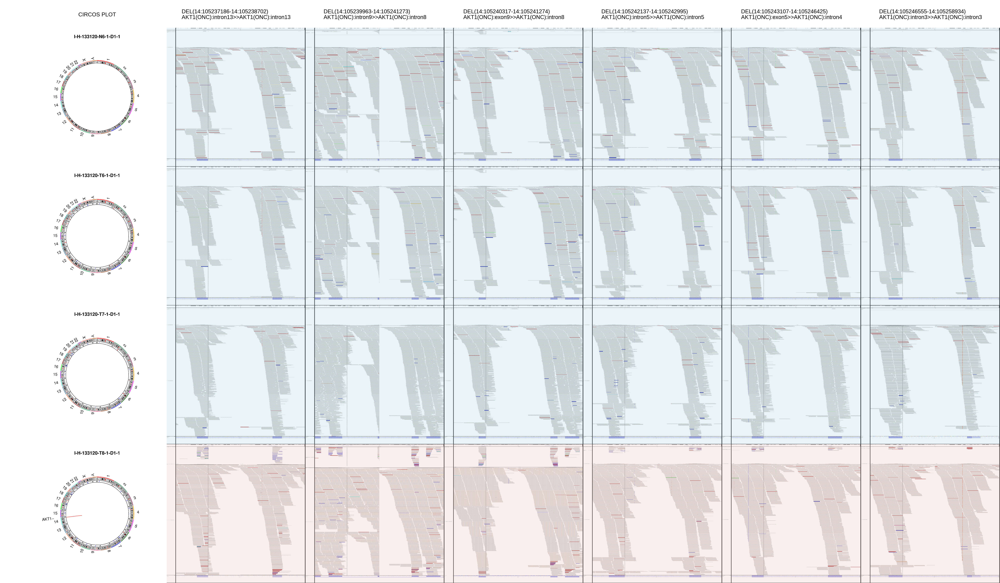

In [232]:
x, y, table= filtered(outdir)
filtered=create_imagen(outdir, x, y, df_out, df_path, dict_annotation)
filtered

In [222]:
table

,I-H-134723-N1-1-D1-1,I-H-134723-T1-1-D1-1,I-H-134723-T2-1-D1-1
nan,,,
TRA(5:1254643-12:6909984),X,"gridss,svaba","gridss,svaba"
DEL(5:112175984-5:112182025),X,"brass,gridss,svaba,delly","brass,gridss,svaba,delly"
INV(12:4383155-12:12026486),X,"brass,gridss,svaba,delly","brass,gridss,svaba,delly"
INV(14:95574389-14:95576093),X,X,"brass,gridss,svaba"
DEL(19:50785160-19:50909329),X,X,X
INV(19:52688215-19:52705121),X,"brass,gridss,svaba,delly","brass,gridss,svaba"


# Show all - BEFORE FILTERING

In [231]:
list_svs = df_out["name"].tolist()
full=create_imagen(outdir, samples_ids, list_svs, df_out, df_path, dict_annotation)
full

# SAME IMAGE

In [215]:

img_path="/home/varelad/test_720_joseph.png"
filtered.save(img_path)